# Capstone Project - Refurbishment of empty buildings into cultural, entepreneurial and education hubs in Madrid
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

The city council of **Madrid (Spain)** counts with **57 empty buildings** of its property. As part of the social development strategy, these buildings will be **converted into cultural, entrepreneurial and education hubs** over the next four years. In order to know which venues should be reconverted sooner, or what type of use should be given to each building, the council has decided to gather data on the areas where each building is located.

Once the characterisation of the areas is done, two variables will be added to help with the prioritisation of buildings:
* Household income 
* Total population

With this **data-based approach**, the council will count with reliable information about the buildings and their surroundings. This project thus aims at creating **visualization tools** that will support the design of an implementation plan.

## Data <a name="data"></a>

Based on the definition of our problem, three types of variables will be gathered:

* Type of area according to the most common venues within 500m of the building.

* Household income in the census section where the building is located.

* Total population of the census section where the building is located.


The data used to build the project will be the following:

* **Location of empty buildings**, in .json format. Source: Open Data Portal of Madrid city council.

* **Venues around buildings**, in .json format. Source: Foursquare API.

* **Census sections of the city of Madrid**, in .shp format. Source: Regional Government of Madrid.

* **Household rent per census section 2016**, in .xlsx format. Source: Spanish Statistic Institute.

* **Total population per census section 2016**, in .xlsx format. Source: Spanish Statistic Institute.

The census section and the population data have been previously merged with ArcGIS Pro, generating a file in .json format. Given its importance for policymaking strategies, the visual information generated for this project (household income and population data) can be used for many other purposes in urban planning.  

All contents are stored in a GitHub account and can be retrieved from there. 

## Methodology <a name="methodology"></a>

In this project, we will direct our efforts on characterising areas of Madrid that surround several buildings. Particularly, we will look at the type of area based on the most prominent venues in each one, and their economic profile based on rent per household data. Additionally, we will add population data to support the decision-making process.

In the **first** step we will download the **data on empty buildings from Madrid's Open Data Portal** with their **coordinates** and we will process it until we have obtained a data frame suitable for our analysis. **Secondly**, each building will be **located** in a map. In the **third** step, we will use **Foursquare API** to collect every **venue around each building with a radius of 500m and a number of venues limited to 100.** Name, coordinates and type will be retrieved for each venue. **Fourth**, we will analyze each of the areas where the buildings are located and find out the ten most common venues in each of them.

In the **fifth** step we are going to use unsupervised learning **K-means** algorithm to cluster the areas and create a new data frame that includes the cluster as well as the **top 10 venues** for each area. With this, we will be ready to map our clusters. **Sixth**, we will examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we will assign a **type to each cluster**. Depending on the type of cluster they fall into, the buildings will be converted into **cultural, entrepreneurial or education hubs**. 

The **seventh** and final step will be devoted to the **production of visualization tools** that can help the city council decide which buildings should be refurbished first, adding two variables. The main variable used will be the **household income per census section**. As this is a social development program, the buildings located in sections with the lowest income will be the first ones to be refurbished. Additionally, **population data** will be displayed to further assist in the decision-making process. 

The main outcome will be a series of visualizations to support Madrid's city council with the implementation strategy for their project "Refurbishment of empty buildings into cultural, entrepreneurial and education hubs".

## Analysis <a name="analysis"></a>

In [72]:
# import libraries
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#import folium
import folium # map rendering library

# import matplotlib for graphs
import matplotlib.pyplot as plt

# import os
import os

print('Libraries imported.')

Libraries imported.


### 1. Data retrieval of public empty buildings in Madrid
In the first step we will download the **data on public empty buildings from Madrid's Open Data Portal** with their **coordinates** and we have processed it until we have obtained a data frame suitable for our analysis.


In [73]:
# import data from Madrid's Open Data Portal
url = 'https://raw.githubusercontent.com/martabescansa7/Coursera_Capstone/master'
buildings = f'{url}/edificios-publicos.json'
# open file
buildings_load = json.loads(requests.get(buildings).text)

In [74]:
buildings_data = buildings_load['@graph']
buildings_data[0]

{'@id': 'https://datos.madrid.es/egob/catalogo/tipo/entidadesyorganismos/13470-aparcamiento-mixto-arquitecto-ribera.json',
 '@type': 'https://datos.madrid.es/egob/kos/entidadesYorganismos/AparcamientosResidentes',
 'id': '13470',
 'title': 'Aparcamiento mixto. Arquitecto Ribera',
 'relation': 'http://www.madrid.es/sites/v/index.jsp?vgnextchannel=bfa48ab43d6bb410VgnVCM100000171f5a0aRCRD&vgnextoid=a50e15cbed51c010VgnVCM2000000c205a0aRCRD',
 'address': {'district': {'@id': 'https://datos.madrid.es/egob/kos/Provincia/Madrid/Municipio/Madrid/Distrito/Centro'},
  'area': {'@id': 'https://datos.madrid.es/egob/kos/Provincia/Madrid/Municipio/Madrid/Distrito/Centro/Barrio/Justicia'},
  'locality': 'MADRID',
  'postal-code': '28004',
  'street-address': 'CALLE BARCELO 2'},
 'location': {'latitude': 40.426687899755734,
  'longitude': -3.6996173701222492},
 'organization': {'organization-desc': 'Plazas: 318 públicas y 298 para residentesAbierto 24 horasAdmite Tarjeta BonoRed Titularidad: Ayuntamien

In [75]:
# define the dataframe columns
column_names = ['Name','Address','PostalCode','City','Latitude','Longitude'] 

# instantiate the dataframe
buildings_mad = pd.DataFrame(columns=column_names)
buildings_mad

,Name,Address,PostalCode,City,Latitude,Longitude


In [76]:
# populate data frame
for data in buildings_data:
    name = building_name = data['title'] 
    address = data['address']['street-address']
    postalcode = data['address']['postal-code']
    city = data['address']['locality']
        
    building_lat = data['location']['latitude']
    building_lon = data['location']['longitude']
    
    buildings_mad = buildings_mad.append({'Name': name,
                                          'Address': address,
                                          'PostalCode':postalcode,
                                          'City':city,
                                          'Latitude': building_lat,
                                          'Longitude': building_lon}, ignore_index=True)

In [77]:
# correct some issues in the data frame
buildings_mad['Name'] = buildings_mad.loc[:,'Name'].str.replace('Aparcamiento público.','')
buildings_mad['Name'] = buildings_mad.loc[:,'Name'].str.replace('Aparcamiento mixto.','')
buildings_mad['Name'] = buildings_mad.loc[:,'Name'].str.replace('disuasorio','')
buildings_mad.iloc[1,1]='CALLE PRADENA DEL RINCON 4'
buildings_mad.iloc[3,1]='CALLE GENERAL YAGUE 11'
buildings_mad.iloc[50,1]='PLAZA ESPANA 20'
buildings_mad.head()

,Name,Address,PostalCode,City,Latitude,Longitude
0,Arquitecto Ribera,CALLE BARCELO 2,28004,MADRID,40.426688,-3.699617
1,Avenida de América (intercambiador),CALLE PRADENA DEL RINCON 4,28002,MADRID,40.438861,-3.676622
2,Avenida de Portugal,AVENIDA PORTUGAL 155,28011,MADRID,40.411180,-3.737832
3,Brasil,CALLE GENERAL YAGUE 11,28020,MADRID,40.456108,-3.694132
4,Casino de la Reina,CALLE CASINO 3,28005,MADRID,40.406793,-3.704609


### 2. Geolocation of buildings
Secondly, each building will be **located** in a map making use of the folium library.

In [78]:
latitude = 40.4167047
longitude = -3.7035825

# create map of Madrid using latitude and longitude values
map_madrid = folium.Map([40.4165001, -3.7025599], zoom_start=12, tiles='CartoDB Positron')
                        
# add markers to map
for lat, lng, name in zip(buildings_mad['Latitude'], buildings_mad['Longitude'], buildings_mad['Name']):
    label = name
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_madrid)  
    
map_madrid

### 3. Data retrieval from Foursquare API
In this step, we will use the **Foursquare API** to collect every **venue around each building with a radius of 500m and a number of venues limited to 100.** Name, coordinates and type will be retrieved for each venue. 


In [79]:
# Foursquare credentials
CLIENT_ID = 'YF5F5UQPG3UG2TMU303I5DGV0PBSSMH5Y54T3QFZP0LYTYJG' # your Foursquare ID
CLIENT_SECRET = 'PW21FAIT5FNKVSEW2PGQRSUTHRNND1T1HIKTAQKCLIKP1DXH' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: YF5F5UQPG3UG2TMU303I5DGV0PBSSMH5Y54T3QFZP0LYTYJG
CLIENT_SECRET:PW21FAIT5FNKVSEW2PGQRSUTHRNND1T1HIKTAQKCLIKP1DXH


In [80]:
# first, we build a function that extracts the category of the venues
LIMIT=100

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Name', 
                  'Building Latitude', 
                  'Building Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [81]:
# execute function
nearby_venues = getNearbyVenues(names=buildings_mad['Name'],
                                   latitudes=buildings_mad['Latitude'],
                                   longitudes=buildings_mad['Longitude']
                                  )

 Arquitecto Ribera
 Avenida de América (intercambiador)
 Avenida de Portugal
 Brasil
 Casino de la Reina
 Condesa de Gavia
 Corazón de María II
 Corona Boreal
 Daoíz y Velarde
 Díaz Porlier
 Encuentro
 Felipe II
 Fuencarral
 Hernani
 Jacinto Benavente
 José Castán Tobeñas
 Marqués de Salamanca
 Miguel Yuste
 Montalbán
 Orense
 Pedro Zerolo 'antes denominado Vázquez de Mella'
 Plaza de Oriente
 Plaza Mayor
 Presidente Carmona
 Recoletos
 República Dominicana
 Reyes Magos
 San Cayetano
 San Germán II (antes General Yagüe)
 Sánchez Bustillo
 Serrano I
 Serrano II
 Serrano III
 Sevilla
 Velázquez - Ayala
 Velázquez - Jorge Juan
 Verdaguer y García
 Estadio Metropolitano Sur ES-02b
 Almagro
 Auditorio Nacional de Música (Príncipe de Vergara)
 Descalzas
 Fernández Shaw
 Glorieta Puerta de Toledo
 Las Cortes
 Luna - Tudescos
 Marqués de Urquijo
 Mostenses
 Museo de la Ciudad
 Olavide
 Plaza de Colón
 Plaza de España
 Plaza del Carmen
 Plaza del Rey
 Santa Ana
 Usera
 Velázquez - Juan Bravo
 V

In [82]:
print(nearby_venues.shape)
nearby_venues.head()

(3700, 7)


,Name,Building Latitude,Building Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Arquitecto Ribera,40.426688,-3.699617,Urso hotel & spa,40.426825,-3.698169,Hotel
1,Arquitecto Ribera,40.426688,-3.699617,sivasdescalzo,40.427086,-3.700796,Shoe Store
2,Arquitecto Ribera,40.426688,-3.699617,Chopper Monster,40.425846,-3.701820,Clothing Store
3,Arquitecto Ribera,40.426688,-3.699617,Macera Tallerbar,40.426102,-3.698176,Cocktail Bar
4,Arquitecto Ribera,40.426688,-3.699617,Le Salon d'Apodaca,40.427256,-3.701432,Salon / Barbershop


In [83]:
count =nearby_venues.groupby('Name').count()
count.head()

,Building Latitude,Building Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Name,,,,,,
Almagro,25,25,25,25,25,25
Arquitecto Ribera,99,99,99,99,99,99
Auditorio Nacional de Música (Príncipe de Vergara),58,58,58,58,58,58
Avenida de América (intercambiador),36,36,36,36,36,36
Avenida de Portugal,22,22,22,22,22,22


In [84]:
print('There are {} uniques categories.'.format(len(nearby_venues['Venue Category'].unique())))

There are 231 uniques categories.


#### We can build a graph to see how many venues are located in the surroundings of each building

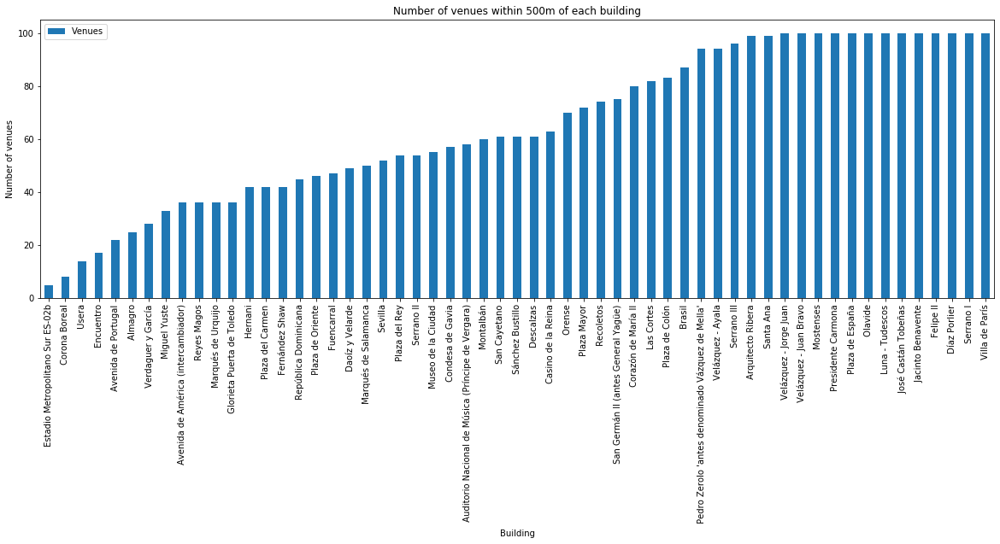

In [85]:
# Organise data
graph =count.loc[:,'Venue Category']
df_graph = pd.DataFrame(data=graph)
df_graph.rename(columns={"Venue Category": "Venues"},inplace=True)
df_graph['Venues']
df_graph.sort_values(by='Venues', ascending=True, inplace=True)

# Plot the graph
df_graph.plot(kind='bar', figsize=(20, 6))

plt.xlabel('Building') # add to x-label to the plot
plt.ylabel('Number of venues') # add y-label to the plot
plt.title('Number of venues within 500m of each building') # add title to the plot

plt.show()

### 4. Analysis of each area
In this step, we will analyze each of the areas where the buildings are located and find out the ten most common venues in each of them.

In [86]:
# one hot encoding
madrid_onehot = pd.get_dummies(nearby_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
madrid_onehot['Name'] = nearby_venues['Name'] 

# move neighborhood column to the first column
fixed_columns = [madrid_onehot.columns[-1]] + list(madrid_onehot.columns[:-1])
madrid_onehot = madrid_onehot[fixed_columns]

madrid_onehot.head()

,Name,Accessories Store,Adult Boutique,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,BBQ Joint,Bagel Shop,Bakery,Bar,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Classroom,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dog Run,Donut Shop,Electronics Store,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Other Event,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Service,Resort,Restaurant,Road,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,South American Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Train Station,Used Bookstore,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Arquitecto Ribera,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Arquitecto Ribera,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [87]:
madrid_grouped = madrid_onehot.groupby('Name').mean().reset_index()
madrid_grouped.head()

,Name,Accessories Store,Adult Boutique,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,BBQ Joint,Bagel Shop,Bakery,Bar,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Classroom,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dog Run,Donut Shop,Electronics Store,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Other Event,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Service,Resort,Restaurant,Road,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,South American Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Train Station,Used Bookstore,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Almagro,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.040000,0.0,0.000000,0.000000,0.0,0.040000,0.0,0.000000,0.0,0.0,0.0,0.0,0.040000,0.0,0.000000,0.0,0.0,0.0,0.040000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.040000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.04,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.040000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.080000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.120000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.

#### Let's print each building along with the top 10 most common venues

In [88]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [89]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
buildings_venues_sorted = pd.DataFrame(columns=columns)
buildings_venues_sorted['Name'] = madrid_grouped['Name']

for ind in np.arange(madrid_grouped.shape[0]):
    buildings_venues_sorted.iloc[ind, 1:] = return_most_common_venues(madrid_grouped.iloc[ind, :], num_top_venues)

buildings_venues_sorted.head()

,Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Almagro,Spanish Restaurant,Italian Restaurant,Plaza,Mediterranean Restaurant,Hotel,Café,French Restaurant,Bistro,Restaurant,Wine Shop
1,Arquitecto Ribera,Restaurant,Bar,Spanish Restaurant,Plaza,Hotel,Vegetarian / Vegan Restaurant,Tapas Restaurant,Italian Restaurant,Bookstore,Ice Cream Shop
2,Auditorio Nacional de Música (Príncipe de Ver...,Spanish Restaurant,Restaurant,Bar,Grocery Store,Plaza,Nightclub,Tapas Restaurant,Japanese Restaurant,Café,Supermarket
3,Avenida de América (intercambiador),Spanish Restaurant,Indian Restaurant,Café,Hotel,Seafood Restaurant,Supermarket,Mediterranean Restaurant,Metro Station,Gastropub,Sushi Restaurant
4,Avenida de Portugal,Spanish Restaurant,Grocery Store,Athletics & Sports,Stadium,Restaurant,Pizza Place,Supermarket,Farmers Market,Tapas Restaurant,Bar


### 5. Area clustering
We have some common patterns in the areas so we are going to use unsupervised learning K-means algorithm to cluster them. K-Means algorithm is one of the most common cluster methods of unsupervised learning.

I will run the elbow method to ensure how many clusters are optimal and then run k-means. Finally, I will create a new data frame that includes the cluster as well as the top 10 venues for each area. With this, we will be ready to map our clusters.

In [90]:
# Elbow method

buildingsmadrid_grouped_clustering = madrid_grouped.drop('Name', 1)
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(buildingsmadrid_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)
    
buildingsmadrid_grouped_clustering.head()

,Accessories Store,Adult Boutique,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,BBQ Joint,Bagel Shop,Bakery,Bar,Basketball Stadium,Beer Bar,Beer Garden,Beer Store,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,College Classroom,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dog Run,Donut Shop,Electronics Store,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Market,Massage Studio,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Other Event,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Service,Resort,Restaurant,Road,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,South American Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Train Station,Used Bookstore,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.040000,0.0,0.000000,0.000000,0.0,0.040000,0.0,0.000000,0.0,0.0,0.0,0.0,0.040000,0.0,0.000000,0.0,0.0,0.0,0.040000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.040000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.04,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.040000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.080000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.120000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0000

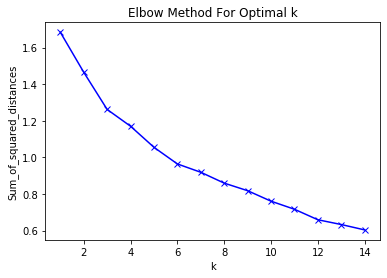

In [91]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

#### The elbow method has revealed that 5 is a good number of clusters. Let's run k-means to cluster the areas into 5 clusters.

In [92]:
# set number of clusters
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(buildingsmadrid_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:5]

array([1, 0, 1, 1, 1])

#### Now let's create a new data frame that includes the cluster as well as the top 10 venues for each area.

In [93]:
# add clustering labels
buildings_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

buildingsmadrid_merged = buildings_mad

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
buildingsmadrid_merged = buildingsmadrid_merged.join(buildings_venues_sorted.set_index('Name'), on='Name')

buildingsmadrid_merged.head() # check the last columns!

buildingsmadrid_merged.to_csv('buildingsSINcluster.csv')


In [94]:
buildingsmadrid_merged[['Cluster Labels','1st Most Common Venue']]
buildingsmadrid_merged.set_index('Cluster Labels')
buildingsmadrid_merged.head()

,Name,Address,PostalCode,City,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arquitecto Ribera,CALLE BARCELO 2,28004,MADRID,40.426688,-3.699617,0,Restaurant,Bar,Spanish Restaurant,Plaza,Hotel,Vegetarian / Vegan Restaurant,Tapas Restaurant,Italian Restaurant,Bookstore,Ice Cream Shop
1,Avenida de América (intercambiador),CALLE PRADENA DEL RINCON 4,28002,MADRID,40.438861,-3.676622,1,Spanish Restaurant,Indian Restaurant,Café,Hotel,Seafood Restaurant,Supermarket,Mediterranean Restaurant,Metro Station,Gastropub,Sushi Restaurant
2,Avenida de Portugal,AVENIDA PORTUGAL 155,28011,MADRID,40.411180,-3.737832,1,Spanish Restaurant,Grocery Store,Athletics & Sports,Stadium,Restaurant,Pizza Place,Supermarket,Farmers Market,Tapas Restaurant,Bar
3,Brasil,CALLE GENERAL YAGUE 11,28020,MADRID,40.456108,-3.694132,1,Spanish Restaurant,Restaurant,Coffee Shop,Italian Restaurant,Tapas Restaurant,Café,Bakery,Burger Joint,Hotel,Japanese Restaurant
4,Casino de la Reina,CALLE CASINO 3,28005,MADRID,40.406793,-3.704609,0,Tapas Restaurant,Bar,Restaurant,Art Gallery,Theater,Café,Coffee Shop,Plaza,Indie Theater,Spanish Restaurant


#### Finally, let's **map** our clusters now.

In [95]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12,tiles='cartodbpositron')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(buildingsmadrid_merged['Latitude'], buildingsmadrid_merged['Longitude'], buildingsmadrid_merged['Name'], buildingsmadrid_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### 6. Examination of clusters
In this step, we will examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, we will assign a name to each cluster.

#### Cluster 0

In [96]:
buildingsmadrid_merged.loc[buildingsmadrid_merged['Cluster Labels'] == 0, buildingsmadrid_merged.columns[[1] + list(range(5, buildingsmadrid_merged.shape[1]))]]

,Address,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,CALLE BARCELO 2,-3.699617,0,Restaurant,Bar,Spanish Restaurant,Plaza,Hotel,Vegetarian / Vegan Restaurant,Tapas Restaurant,Italian Restaurant,Bookstore,Ice Cream Shop
4,CALLE CASINO 3,-3.704609,0,Tapas Restaurant,Bar,Restaurant,Art Gallery,Theater,Café,Coffee Shop,Plaza,Indie Theater,Spanish Restaurant
12,CALLE FUENCARRAL 111,-3.702794,0,Restaurant,Coffee Shop,Bar,Plaza,Ice Cream Shop,Asian Restaurant,Italian Restaurant,Snack Place,Burrito Place,Shoe Store
14,PLAZA JACINTO BENAVENTE 6,-3.703321,0,Hotel,Spanish Restaurant,Plaza,Hostel,Bar,Tapas Restaurant,Restaurant,Dessert Shop,Deli / Bodega,Theater
18,CALLE MONTALBAN 4,-3.691123,0,Hotel,Restaurant,Spanish Restaurant,Café,Plaza,Art Museum,Park,Art Gallery,Mediterranean Restaurant,Japanese Restaurant
20,PLAZA PEDRO ZEROLO 1,-3.699900,0,Restaurant,Clothing Store,Vegetarian / Vegan Restaurant,Hotel,Bakery,Bookstore,Cosmetics Shop,Theater,Coffee Shop,Cocktail Bar
21,PLAZA ORIENTE 1,-3.711641,0,Plaza,Hotel,Ice Cream Shop,Wine Bar,Historic Site,French Restaurant,Tapas Restaurant,Hostel,Performing Arts Venue,Bistro
22,CALLE FELIPE III 11,-3.706896,0,Tapas Restaurant,Plaza,Spanish Restaurant,Hotel,Hostel,Bistro,Gourmet Shop,Wine Bar,Ice Cream Shop,Cocktail Bar
29,CALLE SANCHEZ BUSTILLO 1,-3.694015,0,Café,Restaurant,Spanish Restaurant,Hotel,Garden,Plaza,Sandwich Place,Bookstore,Art Museum,Train Station
33,CALLE ALCALA 17,-3.699808,0,Hotel,Tapas Restaurant,Clothing Store,Restaurant,Electronics Store,Argentinian Restaurant,Art Museum,Cosmetics Shop,Plaza,Theater


#### Cluster 1

In [97]:
buildingsmadrid_merged.loc[buildingsmadrid_merged['Cluster Labels'] == 1, buildingsmadrid_merged.columns[[1] + list(range(5, buildingsmadrid_merged.shape[1]))]]

,Address,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,CALLE PRADENA DEL RINCON 4,-3.676622,1,Spanish Restaurant,Indian Restaurant,Café,Hotel,Seafood Restaurant,Supermarket,Mediterranean Restaurant,Metro Station,Gastropub,Sushi Restaurant
2,AVENIDA PORTUGAL 155,-3.737832,1,Spanish Restaurant,Grocery Store,Athletics & Sports,Stadium,Restaurant,Pizza Place,Supermarket,Farmers Market,Tapas Restaurant,Bar
3,CALLE GENERAL YAGUE 11,-3.694132,1,Spanish Restaurant,Restaurant,Coffee Shop,Italian Restaurant,Tapas Restaurant,Café,Bakery,Burger Joint,Hotel,Japanese Restaurant
5,PLAZA CONDESA DE GAVIA,-3.701916,1,Spanish Restaurant,Tapas Restaurant,Bakery,Pizza Place,Japanese Restaurant,Hotel,Grocery Store,Restaurant,Seafood Restaurant,Pastry Shop
6,CALLE CORAZON DE MARIA 46,-3.666902,1,Spanish Restaurant,Bar,Tapas Restaurant,Bakery,Coffee Shop,Restaurant,Seafood Restaurant,Park,Hotel,Pub
8,AVENIDA CIUDAD DE BARCELONA 3,-3.683544,1,Bar,Spanish Restaurant,Museum,Hotel,Café,Restaurant,Bakery,Italian Restaurant,Art Gallery,Food Truck
9,CALLE DIEGO DE LEON 62,-3.675728,1,Spanish Restaurant,Restaurant,Hotel,Bakery,Bar,Seafood Restaurant,Coffee Shop,Mediterranean Restaurant,Tapas Restaurant,Italian Restaurant
11,CALLE ANTONIA MERCE 5,-3.673434,1,Spanish Restaurant,Tapas Restaurant,Café,Restaurant,Seafood Restaurant,Coffee Shop,Burger Joint,Italian Restaurant,Supermarket,Steakhouse
13,CALLE HERNANI 60,-3.703392,1,Spanish Restaurant,Bakery,Bar,Tapas Restaurant,Grocery Store,Yoga Studio,Sandwich Place,Restaurant,Plaza,Pizza Place
15,CALLE CAPITAN HAYA 57,-3.691647,1,Spanish Restaurant,Restaurant,Coffee Shop,Hotel,Italian Restaurant,Chinese Restaurant,Sandwich Place,Burger Joint,Tapas Restaurant,Paella Restaurant


#### Cluster 2

In [98]:
buildingsmadrid_merged.loc[buildingsmadrid_merged['Cluster Labels'] == 2, buildingsmadrid_merged.columns[[1] + list(range(5, buildingsmadrid_merged.shape[1]))]]

,Address,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,CALLE PEREZ DE VICTORIA,-3.783179,2,Italian Restaurant,Restaurant,Pizza Place,Grocery Store,Soccer Field,Gym Pool,Soccer Stadium,Deli / Bodega,Dog Run,Fish Market


#### Cluster 3

In [99]:
buildingsmadrid_merged.loc[buildingsmadrid_merged['Cluster Labels'] == 3, buildingsmadrid_merged.columns[[1] + list(range(5, buildingsmadrid_merged.shape[1]))]]

,Address,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
37,AVENIDA ARCENTALES 37,-3.598831,3,Soccer Stadium,Sporting Goods Shop,Sports Club,Metro Station,Beer Bar,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Fountain,Football Stadium


#### Cluster 4

In [100]:
buildingsmadrid_merged.loc[buildingsmadrid_merged['Cluster Labels'] == 4, buildingsmadrid_merged.columns[[1] + list(range(5, buildingsmadrid_merged.shape[1]))]]

,Address,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,PLAZA ENCUENTRO 1,-3.652049,4,Bar,Plaza,Pub,Ice Cream Shop,Park,Café,Bakery,Concert Hall,Nightclub,Brewery


#### Now, we are ready to identify each cluster according to their most common type of venues. After having a close look at the data, the following categories have been assigned.

In [101]:
clusters = {'Type': ['Entertainment area','Park area','Residential area','Airport area','Coffee shops area']}
df = pd.DataFrame(data=clusters, index=['Cluster 0','Cluster 1','Cluster 2','Cluster 3','Cluster 4'])
df.set_index('Type')
df

,Type
Cluster 0,Entertainment area
Cluster 1,Park area
Cluster 2,Residential area
Cluster 3,Airport area
Cluster 4,Coffee shops area


### 7. Production of visualization maps
Now that we have characterised each cluster, we need more variables to decide which buildings should be refurbished first. As this is a social development program, the variable used will be the household income data available per census section. Thus, the buildings located in sections with the lowest income will be the first ones to be refurbished. 

In [102]:
# import excel data on household income per census section
url = 'https://raw.githubusercontent.com/martabescansa7/Coursera_Capstone/master'
income = f'{url}/RentaHogares_formateado.xlsx'
df = pd.read_excel(income)
df1 = pd.DataFrame(data=df)
df1.head()

,CDSSCC,POB_TOTAL,HouseholdIncome2016
0,2807901001,1205,48511
1,2807901002,1024,28573
2,2807901003,1940,32679
3,2807901004,1177,54358
4,2807901006,1732,42196


In [103]:
# convert fields to string
df1['CDSSCC'] = df1.CDSSCC.astype(str)
df1['POB_TOTAL'] = df1.POB_TOTAL.astype('int64')
df1.dtypes

# import geojson data of the census sections 
url = 'https://raw.githubusercontent.com/martabescansa7/Coursera_Capstone/master'
censo = f'{url}/SSCC_Madrid.json'

#### Now we can build a map that allows us to identify the buildings (with its corresponding cluster tag) that are located in areas with lower household income (latest data available: year 2016)

In [104]:
# from branca.colormap import linear

m = folium.Map([40.4165001, -3.7025599], zoom_start=10, tiles='CartoDB Positron', overlay=True)
# folium.TileLayer('cartodbpositron', overlay=True).add_to(m)
bins = (0, 20000, 40000, 60000, 80000, 100000)


income=folium.Choropleth(
    geo_data=censo,
    data=df1,
    name='Household Income 2016',
    columns=['CDSSCC', 'HouseholdIncome2016'],
    key_on='feature.properties.CDSSCC',
    fill_color='YlGn',
    fill_opacity=1,
    line_opacity=0.2,
    highlight=True,
    legend=True,
    legend_name='Household Income 2016',
    bins=bins
).add_to(m)

# add clusters to the map
markers_colors = []
for lat, lon, poi, cluster in zip(buildingsmadrid_merged['Latitude'], buildingsmadrid_merged['Longitude'], buildingsmadrid_merged['Name'], buildingsmadrid_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    puntos=folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1,
        overlay=False).add_to(m)

folium.LayerControl(position='topright', collapsed=False, autoZIndex=True).add_to(m)

m.save(os.path.join('choropleth.html'))

m

#### Additionally, we can add population data to help us evaluate where there is a higher number of potential users. 

In [105]:
m = folium.Map([40.4165001, -3.7025599], zoom_start=10, tiles='CartoDB Positron', overlay=True)
# folium.TileLayer('cartodbpositron', overlay=True).add_to(m)
bins = (0, 500, 1000, 1500, 2000, 2500,3000,3500,4000)

pop=folium.Choropleth(
    geo_data=censo,
    data=df1,
    name='Population 2016',
    columns=['CDSSCC', 'POB_TOTAL'],
    key_on='feature.properties.CDSSCC',
    fill_color='YlOrBr',
    fill_opacity=1,
    line_opacity=0.2,
    highlight=True,
    legend=True,
    legend_name='Population 2016',
    bins=bins

).add_to(m)


# add clusters to the map
markers_colors = []
for lat, lon, poi, cluster in zip(buildingsmadrid_merged['Latitude'], buildingsmadrid_merged['Longitude'], buildingsmadrid_merged['Name'], buildingsmadrid_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    puntos=folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1,
        overlay=False).add_to(m)
    

folium.LayerControl(position='topright', collapsed=False, autoZIndex=True).add_to(m)

m.save(os.path.join('choropleth.html'))

m

## Results and Discussion <a name="results"></a>

Regarding the **clustering** process, the information contained in the Foursquare API is limited for Spain. Although the clustering results are not entirely wrong, a more accurate picture of each area could have been obtained with comprehensive data. This obviously affects the decision-making process, as buildings may fall into a cluster type that does not represent them. 

On the other hand, the production of the variable regarding **household income** is based on very accurate data. The use of this type of data is extremely useful for public investment policies. In the present project, it serves a basis for the prioritization of buildings to be refurbished. A total of 23 buildings fall into lower-income census sections and will be the first ones to be remodeled.

Further decisions can be taken with these visualization tools. Thanks to the display of **population data**, it is possible to predict which venues will have a larger number of users. Thus, this variable could also be used for the prioritization of buildings.

In general, the folium library is very acceptable for the visualization of data. However, its functionalities are limited. For this reason, I have created a simple app with ArcGIS Online to produce a more user-friendly app. Here is the link:
http://martabescansa7.maps.arcgis.com/apps/webappviewer/index.html?id=7a8d2ef5e7d34b9193dfbdd2841dacb7.

## Conclusion <a name="conclusion"></a>

We have built different **visualizations that will be used by Madrid's council to design the implementation strategy for their project** "Refurbishment of empty buildings into cultural, entrepreneurial and innovation hubs". Although the underlying data coming for the Foursquare API is not comprehensive enough for Spanish cities, the developed workflow illustrates how useful it is to produce visual data as a support tool for policymaking processes in local governments.